In [2]:
import json
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import wordnet as wn
import PIL.Image

In [4]:
with open('data/clean.json') as json_data:
    data = json.load(json_data)
len(data)

400

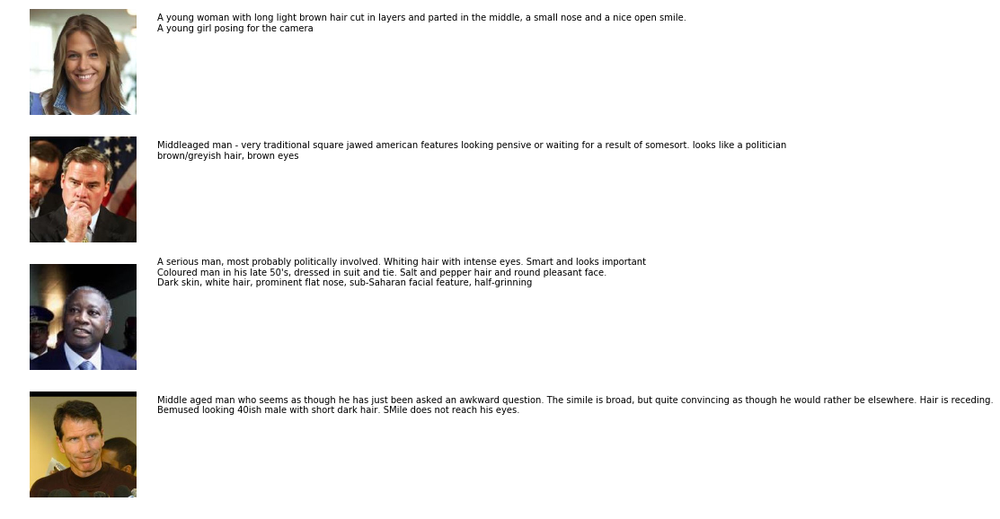

In [5]:
f = plt.figure(figsize=(10,10))
for i,sample in enumerate(data[:4]):
    plt.subplot(4,1,i+1)
    img = mpimg.imread("data/lfw/"+sample["image"].replace('bmp',"jpg"))
    plt.imshow(img)
    plt.text(300,50,"\n".join([desc['text'] for desc in sample['descriptions']]))
    plt.axis('off')

In [7]:
from transparent_latent_gan.src.tl_gan import feature_axis
import glob, os,pickle
import transparent_latent_gan.src.tl_gan.feature_celeba_organize as feature_celeba_organize
import importlib

In [8]:
path_feature_direction = './transparent_latent_gan/asset_results/pg_gan_celeba_feature_direction_40'

pathfile_feature_direction = glob.glob(os.path.join(path_feature_direction, 'feature_direction_*.pkl'))[-1]

with open(pathfile_feature_direction, 'rb') as f:
    feature_direction_name = pickle.load(f)

feature_direction = feature_direction_name['direction']
feature_name = feature_direction_name['name']
num_feature = feature_direction.shape[1]


importlib.reload(feature_celeba_organize)
feature_name = feature_celeba_organize.feature_name_celeba_rename
feature_direction = feature_direction_name['direction'] * feature_celeba_organize.feature_reverse[None, :]

len_z = 512

# Keywords

In [9]:
sent_to_img = []
sentences = []
for i,sample in enumerate(data):
    """"" separate descriptions 
    for desc in sample['descriptions']:
        text = word_tokenize(desc['text'].lower()) 
        sent_to_img.append(i)
        sentences.append(text)
    """"" 
    text = word_tokenize(" ".join([desc['text'].lower() for desc in sample['descriptions']]))
    sent_to_img.append(i)
    sentences.append(text)

In [10]:
related = { 
 'Shadow':['beard','unshaven'],
 'Arched_Eyebrows':['curved','trimmed'],
 'Attractive':['pretty','cute','handsome','sexy','beautiful'],
 'Eye_bags':['tired','exhausted'],
 'Bald':['hairless','receding hairline'],
 'Bangs':['fringe','short hair'],
 'Big_Lips':['dark skin','african','plump','full'],
 'Big_Nose':['dark skin','african','large nose','wide nose'],
 'Black_Hair':['dark hair','asian'],
 'Blond_Hair':['caucasian','white hair','golden hair','pale','light hair'],
 'Blurry':['foggy','out of focus'],
 'Brown_Hair':[''],
 'Bushy_Eyebrows':['wild','unkempt'],
 'Chubby':['fat','overweight','round','cute'],
 'Double_Chin':['fat','overweight'],
 'Eyeglasses':['glasses','spectacles','sunglasses','shades','specs'],
 'Goatee':['creepy','beard'],
 'Gray_Hair':['old','silver hair','salt','white hair'],
 'Makeup':[''],
 'High_Cheekbones':['sharp','thin'],
 'Male':['masculine','manly','man'],
 'Mouth_Open':['wide smile','happy','yelling','talking'],
 'Mustache':['creepy'],
 'Narrow_Eyes':['asian','oriental','squinting','smiling'],
 'Beard':['masculine','manly','shaggy'],
 'Oval_Face':['round face'],
 'Skin_Tone':['dark skin','black','african-american'],
 'Pointy_Nose':['cheeky','narrow','clever'],
 'Hairline':['bald','old','tomboy','short hair','cut','receding hair','pixie'],
 'Rosy_Cheeks':['young','healthy','blush'],
 'Sideburns':['beard','hairy','wild'],
 'Smiling':['happy','cheerful','laughing','smile'],
 'Straight_Hair':[''],
 'Wavy_Hair':['curl','black','frilly'],
 'Earrings':['jewelerry','fancy'],
 'Hat':['cap','beanie','tophat'],
 'Lipstick':['fancy','red lips','heavy make'],
 'Necklace':['jewelerry','fancy'],
 'Necktie':['fancy','professional','formal','tie','suit'],
 'Age':['old','wrinkles','60s','70s','80s','90s']
}

opposite = {
 'Shadow':[''],
 'Arched_Eyebrows':[''],
 'Attractive':['ugly','dull','old'],
 'Eye_bags':['perky','lively','fresh'],
 'Bald':[''],
 'Bangs':[''],
 'Big_Lips':['thin','line','annoyed'],
 'Big_Nose':['small','tiny','asian'],
 'Black_Hair':[''],
 'Blond_Hair':[''],
 'Blurry':[''],
 'Brown_Hair':[''],
 'Bushy_Eyebrows':[''],
 'Chubby':['thin','malnourished','skinny','narrow face'],
 'Double_Chin':[''],
 'Eyeglasses':[''],
 'Goatee':[''],
 'Gray_Hair':[''],
 'Makeup':[''],
 'High_Cheekbones':[''],
 'Male':['woman','female','feminine'],
 'Mouth_Open':[''],
 'Mustache':[''],
 'Narrow_Eyes':['wide eyes','big eyes','doe eyes','surprised','scared'],
 'Beard':[''],
 'Oval_Face':['square','sharp'],
 'Skin_Tone':['white','pale','snow','caucasian'],
 'Pointy_Nose':['flat nose'],
 'Hairline':['long hair', 'flowing'],
 'Rosy_Cheeks':['pallid','pale'],
 'Sideburns':[''],
 'Smiling':['angry','frowning','cross','pouting'],
 'Straight_Hair':[''],
 'Wavy_Hair':[''],
 'Earrings':[''],
 'Hat':[''],
 'Lipstick':[''],
 'Necklace':[''],
 'Necktie':['casual'],
 'Age':['middleaged','young','child','twenties','20s','smooth']
}

def plain_get_features_from_text(text):
    phrases = [phrase.split("_")[0].lower() for phrase in feature_name]
    
    out = [1 if phrase in text else 0 for phrase in phrases]
    
    for i,f in enumerate(feature_name):
        for word in related[f]:
            if word in text:
                out[i] += 0.5
        for word in opposite[f]:
            if word in text:
                out[i] -= 0.5

    return out

## Example for for single image

'an old man , with graying hair and wrinkles appears to have of been caught unwittingly entering his house . an older adult male , looking somewhat confused , angry or anxious . he seems to be from a mediterranean area . old man looking suspicious wearing casual clothes looks like a man in his sixties , salt-and-pepper hair , some wrinkles on face and neck , large nose . lips slightly apart'

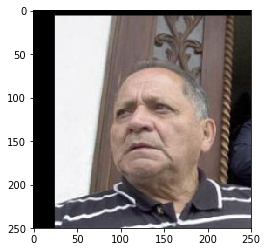

In [13]:
imnum = 9
text = sentences[imnum]
plt.imshow(mpimg.imread("data/lfw/"+data[imnum]["image"].replace('bmp',"jpg")))
" ".join(text)

In [23]:
y = plain_get_features_from_text(text)
list(zip(feature_name,y))

[('Shadow', 0),
 ('Arched_Eyebrows', 0),
 ('Attractive', -0.5),
 ('Eye_bags', 0),
 ('Bald', 0),
 ('Bangs', 0),
 ('Big_Lips', 0),
 ('Big_Nose', 0),
 ('Black_Hair', 0),
 ('Blond_Hair', 0),
 ('Blurry', 0),
 ('Brown_Hair', 0),
 ('Bushy_Eyebrows', 0),
 ('Chubby', 0),
 ('Double_Chin', 0),
 ('Eyeglasses', 0),
 ('Goatee', 0),
 ('Gray_Hair', 0.5),
 ('Makeup', 0),
 ('High_Cheekbones', 0),
 ('Male', 1.5),
 ('Mouth_Open', 0),
 ('Mustache', 0),
 ('Narrow_Eyes', 0),
 ('Beard', 0),
 ('Oval_Face', 0),
 ('Skin_Tone', 0),
 ('Pointy_Nose', 0),
 ('Hairline', 0.5),
 ('Rosy_Cheeks', 0),
 ('Sideburns', 0),
 ('Smiling', -0.5),
 ('Straight_Hair', 0),
 ('Wavy_Hair', 0),
 ('Earrings', 0),
 ('Hat', 0),
 ('Lipstick', 0),
 ('Necklace', 0),
 ('Necktie', -0.5),
 ('Age', 1.0)]

In [11]:
list(zip(feature_name,y))
np.array(y)

array([ 0. ,  0. , -0.5,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ,
        0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  0.5,  0. ,  0. ,  1.5,  0. ,
        0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  1. ,  0. ,  0. , -0.5,  0. ,
        0. ,  0. ,  0. ,  0. ,  0. , -0.5,  1. ])

## for each image

In [ ]:
result = []
for text in sentences:
    y = plain_get_features_from_text(text)
    result.append(y)
#np.savetxt("simple_feats_v4.txt",np.array(result))

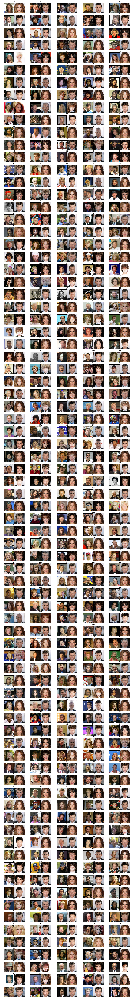

In [9]:
f = plt.figure(figsize=(20,160))
for i,sample in enumerate(data):
    plt.subplot(80,5,i+1)
    img = PIL.Image.open("lfw/"+sample["image"].replace('bmp',"jpg"))
    img2 = PIL.Image.open("model_predicted_modified/test_{}.png".format(i)).resize((250,250))
    plt.imshow(np.hstack([np.asarray(img),np.asarray(img2)]))
    plt.title(str(i))
    plt.axis('off')
plt.savefig("pretrained_modified_summary.png")